# IT9205 — Deep Learning for Computer Vision
## Part A: Image Preprocessing Pipeline

**Student:** Hatem Isa &nbsp;|&nbsp; **ID:** 202508993 &nbsp;|&nbsp; **Bahrain Polytechnic MSc AI**

**Problem Domain:** Automated Vehicle Detection and Classification in Traffic Scenes

**Dataset:** Vehicles-COCO (Roboflow) — 18,998 annotated images, 4 classes: Car, Bus, Truck, Motorcycle

---

This notebook covers the complete image preprocessing pipeline applied to vehicle traffic images before model training. Every technique is justified specifically for the traffic/vehicle domain.

## Cell 0 — Environment Setup

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import pathlib
import shutil
import random
import os
import json
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

print(f'OpenCV  : {cv2.__version__}')
print(f'TF      : {tf.__version__}')
print(f'GPU     : {len(tf.config.list_physical_devices("GPU")) > 0}')

OpenCV  : 4.13.0
TF      : 2.20.0
GPU     : False


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Helper Functions

In [5]:
def imshow(title='', image=None, size=7):
    """Display a single image (handles BGR and grayscale)."""
    w, h = image.shape[1], image.shape[0]
    plt.figure(figsize=(size * w / h, size))
    if len(image.shape) == 2:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=12); plt.axis('off'); plt.tight_layout(); plt.show()

def imshow_grid(images, titles, cols=3, size=4, cmap_list=None):
    """Display multiple images in a grid with individual cmap support."""
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    axes = np.array(axes).flatten()
    for i, (ax, im, t) in enumerate(zip(axes, images, titles)):
        cmap = cmap_list[i] if cmap_list else None
        if len(im.shape) == 2:
            ax.imshow(im, cmap=cmap or 'gray')
        else:
            ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
        ax.set_title(t, fontsize=10); ax.axis('off')
    for ax in axes[len(images):]:
        ax.axis('off')
    plt.tight_layout(); plt.show()

def before_after(original, processed, orig_title='Original', proc_title='Processed', size=5):
    """Side-by-side before/after comparison."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(size * 2, size))
    def _show(ax, img, title):
        if len(img.shape) == 2:
            ax.imshow(img, cmap='gray')
        else:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(title, fontsize=11); ax.axis('off')
    _show(ax1, original, orig_title)
    _show(ax2, processed, proc_title)
    plt.tight_layout(); plt.show()

print('✅ Helper functions loaded')

✅ Helper functions loaded


---
## A1 — Dataset Download & Setup

The dataset is sourced from Roboflow: **Vehicles-COCO** (MS-COCO Vehicle Detection subset).

- **Source:** https://universe.roboflow.com/vehicle-mscoco/vehicles-coco
- **Total images:** 18,998 annotated images
- **Classes:** 4 — Car, Bus, Truck, Motorcycle
- **Split:** Pre-split 80/20 (train/val)
- **Annotations:** Bounding boxes in YOLO TXT format
- **Why suitable:** Real-world traffic scenes with diverse lighting, weather, and viewing angles — directly representative of deployment conditions

In [6]:
# Mount Google Drive and set dataset path
from google.colab import drive
drive.mount('/content/drive')

import pathlib
DATASET_PATH = pathlib.Path('/content/drive/MyDrive/Colab Notebooks/Semester 2/IT9205 - Deep Learning for Computer Vision/IT9205_Project/Vehicles-coco.v1-new-vehicle-dataset.yolov8')
assert DATASET_PATH.exists(), f'Dataset not found at {DATASET_PATH}'
print(f'Dataset found at: {DATASET_PATH}')
print('Contents:', list(DATASET_PATH.iterdir()))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset found at: /content/drive/MyDrive/Colab Notebooks/Semester 2/IT9205 - Deep Learning for Computer Vision/IT9205_Project/Vehicles-coco.v1-new-vehicle-dataset.yolov8
Contents: [PosixPath('/content/drive/MyDrive/Colab Notebooks/Semester 2/IT9205 - Deep Learning for Computer Vision/IT9205_Project/Vehicles-coco.v1-new-vehicle-dataset.yolov8/README.dataset.txt'), PosixPath('/content/drive/MyDrive/Colab Notebooks/Semester 2/IT9205 - Deep Learning for Computer Vision/IT9205_Project/Vehicles-coco.v1-new-vehicle-dataset.yolov8/data.yaml'), PosixPath('/content/drive/MyDrive/Colab Notebooks/Semester 2/IT9205 - Deep Learning for Computer Vision/IT9205_Project/Vehicles-coco.v1-new-vehicle-dataset.yolov8/README.roboflow.txt'), PosixPath('/content/drive/MyDrive/Colab Notebooks/Semester 2/IT9205 - Deep Learning for Computer Vision/IT9205_Project/Vehicles-coco.v1-new-veh

## A2 — Dataset Exploration

Before applying any preprocessing, the dataset is explored to understand its structure, class distribution, and visual properties. This directly informs which preprocessing techniques are appropriate.

In [7]:
# ── Dataset structure ──────────────────────────────────────────
train_img_dir = DATASET_PATH / 'train' / 'images'
val_img_dir   = DATASET_PATH / 'valid' / 'images'
train_lbl_dir = DATASET_PATH / 'train' / 'labels'

train_images = sorted(train_img_dir.glob('*.jpg'))
val_images   = sorted(val_img_dir.glob('*.jpg'))

print(f'Training images  : {len(train_images)}')
print(f'Validation images: {len(val_images)}')
print(f'Total            : {len(train_images) + len(val_images)}')

# Class names from data.yaml
import yaml
with open(DATASET_PATH / 'data.yaml') as f:
    data_cfg = yaml.safe_load(f)
CLASS_NAMES = data_cfg['names']
NUM_CLASSES  = len(CLASS_NAMES)
print(f'\nClasses ({NUM_CLASSES}): {CLASS_NAMES}')

Training images  : 13300
Validation images: 3798
Total            : 17098

Classes (4): ['bus', 'car', 'motorcycle', 'truck']


Training annotation counts:
  car         :  32170  (63.8%)  ████████████████████████████████████████████████████████████████
  bus         :   4466  (8.9%)  ████████
  truck       :   7257  (14.4%)  ██████████████
  motorcycle  :   6501  (12.9%)  █████████████


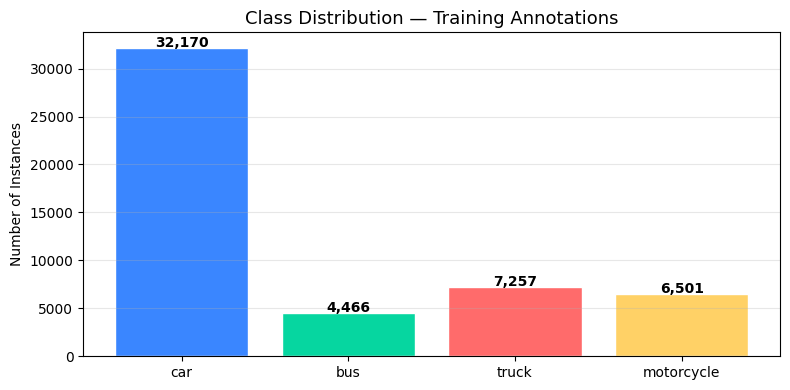

In [8]:
# ── Class distribution from YOLO labels ──────────────────────
class_counts = Counter()
for lbl_path in (DATASET_PATH / 'train' / 'labels').glob('*.txt'):
    with open(lbl_path) as f:
        for line in f:
            cls_id = int(line.split()[0])
            class_counts[CLASS_NAMES[cls_id]] += 1

print('Training annotation counts:')
total_anns = sum(class_counts.values())
for cls, cnt in class_counts.items():
    bar = '█' * (cnt // 500)
    print(f'  {cls:<12}: {cnt:>6}  ({cnt/total_anns*100:.1f}%)  {bar}')

# Bar chart
fig, ax = plt.subplots(figsize=(8, 4))
colors = ['#3A86FF', '#06D6A0', '#FF6B6B', '#FFD166']
bars = ax.bar(class_counts.keys(), class_counts.values(), color=colors, edgecolor='white')
ax.set_title('Class Distribution — Training Annotations', fontsize=13)
ax.set_ylabel('Number of Instances')
ax.grid(axis='y', alpha=0.3)
for bar, cnt in zip(bars, class_counts.values()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 100,
            f'{cnt:,}', ha='center', fontsize=10, fontweight='bold')
plt.tight_layout(); plt.show()

# ANALYSIS: Class imbalance — if Car heavily dominates, note this as a challenge
# that will require class-weighted training in Part B

In [9]:
# ── Image dimensions analysis ─────────────────────────────────
sample_sizes = []
for p in train_images[:200]:   # sample 200 images
    img = cv2.imread(str(p))
    if img is not None:
        sample_sizes.append((img.shape[1], img.shape[0]))  # (W, H)

widths  = [s[0] for s in sample_sizes]
heights = [s[1] for s in sample_sizes]
print(f'Width  range: {min(widths)} – {max(widths)} px  (mean: {int(np.mean(widths))})')
print(f'Height range: {min(heights)} – {max(heights)} px  (mean: {int(np.mean(heights))})')
print(f'\nConclusion: Variable resolutions require resizing to a fixed size before training.')
print(f'  - Classification model → 224×224 (ImageNet standard)')
print(f'  - Detection model (YOLOv8) → 640×640 (YOLO standard)')

Width  range: 640 – 640 px  (mean: 640)
Height range: 640 – 640 px  (mean: 640)

Conclusion: Variable resolutions require resizing to a fixed size before training.
  - Classification model → 224×224 (ImageNet standard)
  - Detection model (YOLOv8) → 640×640 (YOLO standard)


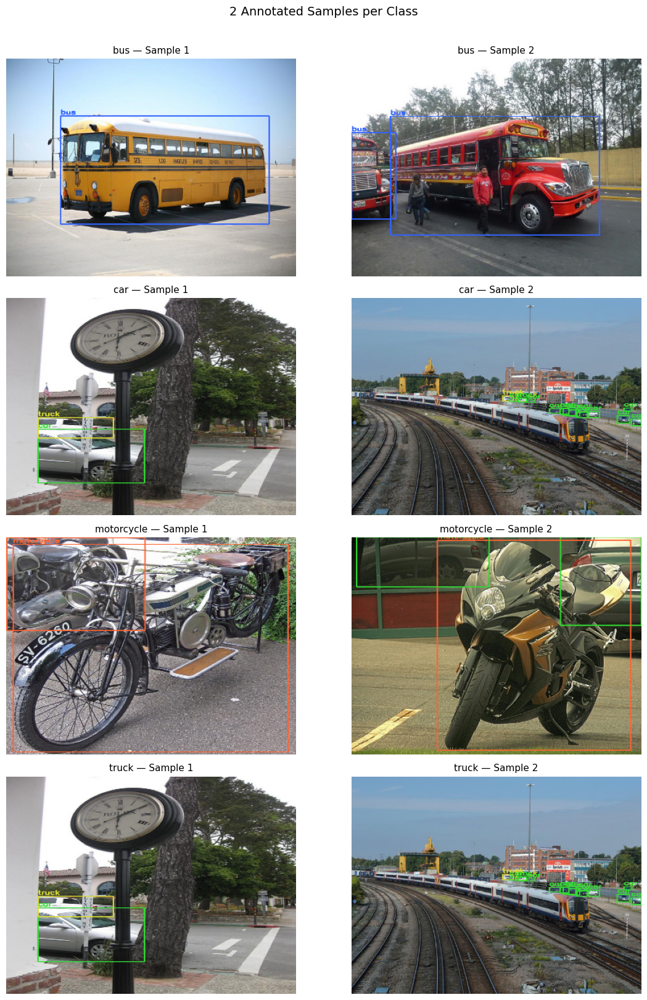

In [10]:
# ── Sample images per class with bounding boxes ───────────────
def load_with_boxes(img_path, lbl_path, class_names):
    """Load image and draw YOLO bounding boxes on it."""
    img = cv2.imread(str(img_path))
    if img is None or not lbl_path.exists():
        return img
    h, w = img.shape[:2]
    colors_bgr = [(255, 100, 50), (50, 220, 50), (50, 100, 255), (50, 220, 220)]
    with open(lbl_path) as f:
        for line in f:
            parts = list(map(float, line.split()))
            cls_id = int(parts[0])
            cx, cy, bw, bh = parts[1:5]
            x1 = int((cx - bw/2) * w); y1 = int((cy - bh/2) * h)
            x2 = int((cx + bw/2) * w); y2 = int((cy + bh/2) * h)
            cv2.rectangle(img, (x1, y1), (x2, y2), colors_bgr[cls_id], 2)
            cv2.putText(img, class_names[cls_id], (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors_bgr[cls_id], 2)
    return img

# Show 2 annotated samples per class
fig, axes = plt.subplots(NUM_CLASSES, 2, figsize=(12, 4 * NUM_CLASSES))
shown = {cls: 0 for cls in CLASS_NAMES}

for img_path in train_images:
    lbl_path = train_lbl_dir / (img_path.stem + '.txt')
    if not lbl_path.exists():
        continue
    with open(lbl_path) as f:
        classes_in_img = [int(l.split()[0]) for l in f.readlines()]
    for cls_id in set(classes_in_img):
        cls_name = CLASS_NAMES[cls_id]
        if shown[cls_name] < 2:
            row = cls_id
            col = shown[cls_name]
            img_box = load_with_boxes(img_path, lbl_path, CLASS_NAMES)
            axes[row][col].imshow(cv2.cvtColor(
                cv2.resize(img_box, (400, 300)), cv2.COLOR_BGR2RGB))
            axes[row][col].set_title(f'{cls_name} — Sample {col+1}', fontsize=11)
            axes[row][col].axis('off')
            shown[cls_name] += 1
    if all(v >= 2 for v in shown.values()):
        break

plt.suptitle('2 Annotated Samples per Class', fontsize=14, y=1.01)
plt.tight_layout(); plt.show()

## A3 — Visual Characteristics Analysis

Before selecting preprocessing techniques, the key visual characteristics of traffic images that create challenges for deep learning models are identified:

| # | Characteristic | Challenge | Preprocessing Response |
|---|---|---|---|
| 1 | **Variable lighting** (day/night/dusk) | Pixel intensity ranges differ drastically across images — same vehicle class looks different | CLAHE histogram equalization to normalise contrast |
| 2 | **Variable resolution** (400×300 to 1920×1080) | Different spatial scales break fixed-size model inputs | Resize to 224×224 (classification) or 640×640 (detection) |
| 3 | **Sensor noise** (CCTV, dashcam grain) | High-frequency noise can be misidentified as edges | Gaussian blur before edge-based operations |
| 4 | **Colour overlap between classes** | Cars and buses share similar body colours — grayscale loses discriminative colour info | HSV colour space preserves hue independently of brightness |
| 5 | **Multiple vehicles per frame** | Vehicles occlude each other — edges define object boundaries | Canny edge detection highlights vehicle silhouettes |

Sample image: 000000001762_jpg.rf.d49abaee409369601959b6625cc688e8.jpg
Shape  : (640, 640, 3)  (H=640, W=640)
Dtype  : uint8
Min/Max: 0 / 255


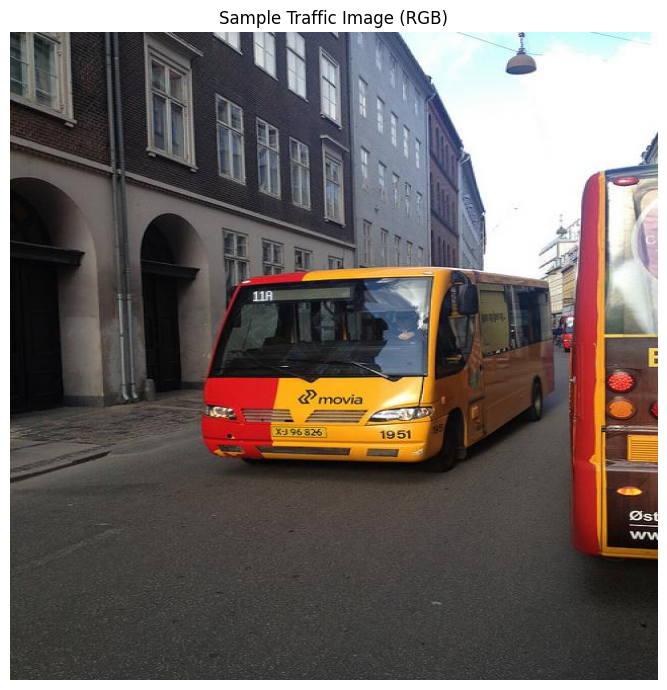

In [11]:
# Load a representative sample for all preprocessing demonstrations
SAMPLE_PATH = train_images[42]   # pick a varied traffic scene
img_bgr = cv2.imread(str(SAMPLE_PATH))
h, w    = img_bgr.shape[:2]

print(f'Sample image: {SAMPLE_PATH.name}')
print(f'Shape  : {img_bgr.shape}  (H={h}, W={w})')
print(f'Dtype  : {img_bgr.dtype}')
print(f'Min/Max: {img_bgr.min()} / {img_bgr.max()}')

imshow('Sample Traffic Image (RGB)', img_bgr, size=7)

---
## A4 — Preprocessing Pipeline

### Step 1: Resize

**Justification:** The dataset contains images with varying resolutions (400×300 to 1920×1080). All deep learning models require fixed-size inputs. Resizing to 224×224 matches the ImageNet pre-training resolution used by ResNet50, MobileNetV2 and similar backbones. `INTER_AREA` is used for downscaling as it produces the least aliasing compared to `INTER_LINEAR` or `INTER_CUBIC`.

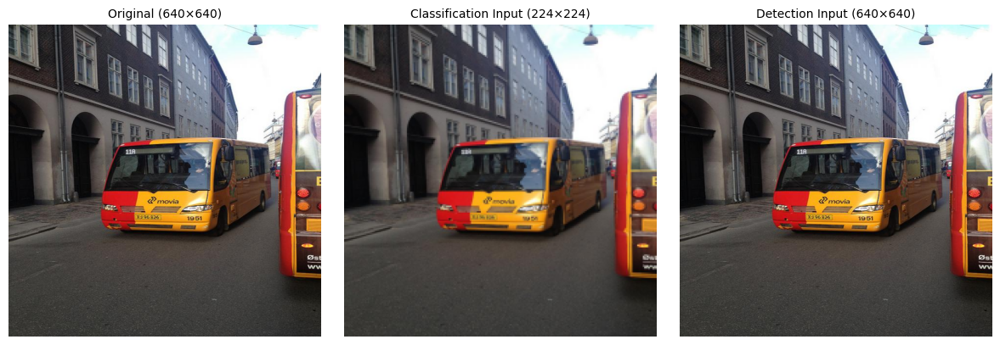

Original   : (640, 640, 3)
CLF resized: (224, 224, 3)
DET resized: (640, 640, 3)


In [12]:
# Step 1: Resize
CLF_SIZE = (224, 224)   # classification input
DET_SIZE = (640, 640)   # detection input (YOLO standard)

resized_clf = cv2.resize(img_bgr, CLF_SIZE, interpolation=cv2.INTER_AREA)
resized_det = cv2.resize(img_bgr, DET_SIZE, interpolation=cv2.INTER_AREA)

imshow_grid(
    [img_bgr, resized_clf, resized_det],
    [f'Original ({w}×{h})', f'Classification Input (224×224)', f'Detection Input (640×640)'],
    cols=3, size=4
)
print(f'Original   : {img_bgr.shape}')
print(f'CLF resized: {resized_clf.shape}')
print(f'DET resized: {resized_det.shape}')

### Step 2: Colour Space Analysis

**Justification:** BGR is OpenCV's default but unintuitive for colour-based analysis. **HSV** separates Hue (colour type) from Value (brightness), making it robust to lighting changes — critical for traffic images captured at different times of day. The Hue channel alone can distinguish a red bus from a blue car even under dim lighting where BGR values would overlap.

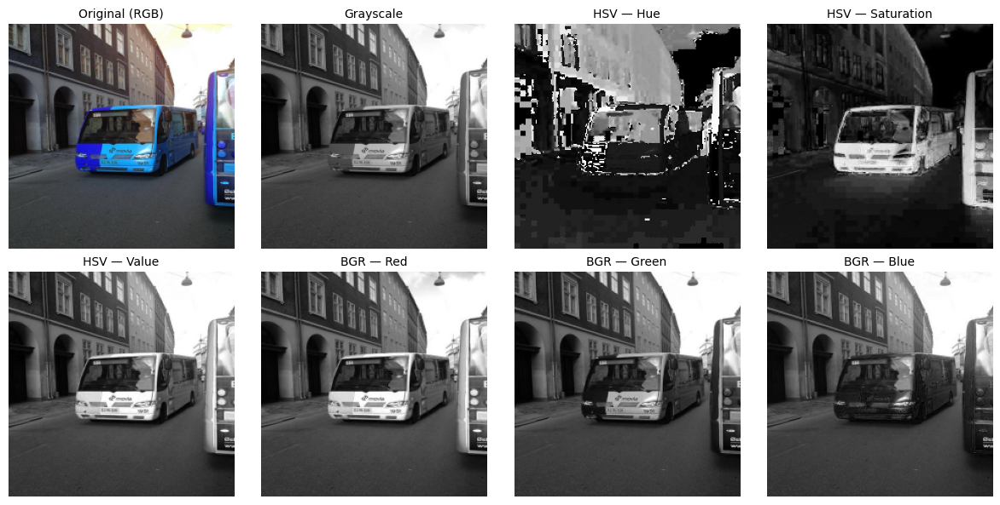

In [13]:
# Step 2: Colour space exploration
img_work = resized_clf.copy()   # work on the resized image from now on

gray = cv2.cvtColor(img_work, cv2.COLOR_BGR2GRAY)
hsv  = cv2.cvtColor(img_work, cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(hsv)
B, G, R = cv2.split(img_work)

imshow_grid(
    [cv2.cvtColor(img_work, cv2.COLOR_BGR2RGB),
     gray, H, S, V, R, G, B],
    ['Original (RGB)', 'Grayscale',
     'HSV — Hue', 'HSV — Saturation', 'HSV — Value',
     'BGR — Red', 'BGR — Green', 'BGR — Blue'],
    cols=4, size=3
)
# KEY INSIGHT: The Hue channel separates vehicle colours clearly.
# Grayscale loses all colour distinction — a red truck and a green truck
# become identical in grayscale, making class separation harder.

### Step 3: CLAHE — Contrast Limited Adaptive Histogram Equalization

**Justification:** Traffic camera images suffer from extreme lighting variation — bright midday sun vs dark night footage. Standard histogram equalization applies a global contrast stretch that can over-amplify noise in bright regions. **CLAHE** divides the image into small tiles (8×8) and equalises each independently with a clip limit to prevent noise amplification. This is especially important for night-time vehicle images where licence plates and body details are underexposed.

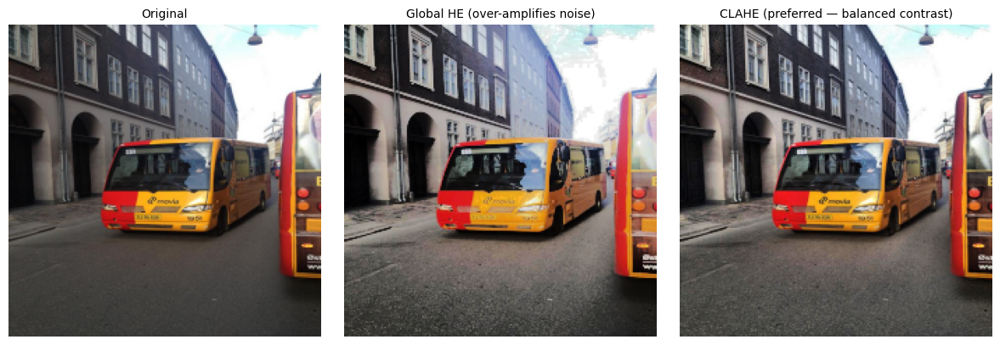

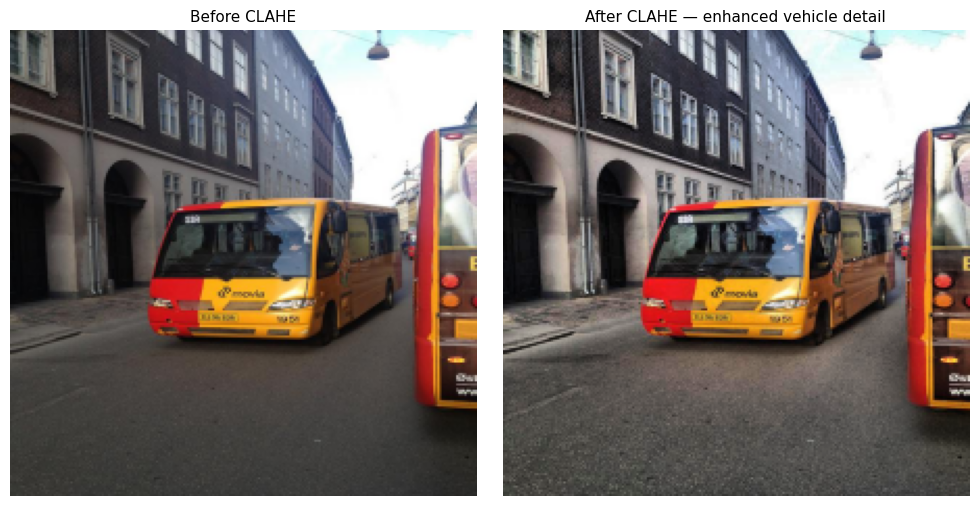

In [14]:
# Step 3: CLAHE on the Value channel of HSV
# Apply to V channel only — preserves colour (Hue) while boosting brightness
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
V_eq  = clahe.apply(V)

hsv_eq     = cv2.merge([H, S, V_eq])
img_clahe  = cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2BGR)

# Also compare global HE
V_global   = cv2.equalizeHist(V)
hsv_global = cv2.merge([H, S, V_global])
img_global = cv2.cvtColor(hsv_global, cv2.COLOR_HSV2BGR)

imshow_grid(
    [img_work, img_global, img_clahe],
    ['Original', 'Global HE (over-amplifies noise)', 'CLAHE (preferred — balanced contrast)'],
    cols=3, size=4
)
before_after(img_work, img_clahe,
             'Before CLAHE', 'After CLAHE — enhanced vehicle detail')
# CLAHE chosen over global HE because it avoids noise amplification in
# uniformly bright sky regions common in traffic scene images.

### Step 4: Gaussian Blur — Noise Reduction

**Justification:** Traffic images captured by CCTV and dashcam sensors contain Gaussian sensor noise (random pixel-level variation). This noise creates false detections in edge-based operations like Canny. A **5×5 Gaussian blur** removes this noise by weighting each pixel as a Gaussian-weighted average of its neighbourhood. A 5×5 kernel was chosen over 3×3 (too weak for CCTV noise) and 9×9 (too much smoothing — loses vehicle edge detail).

/tmp/ipykernel_3831/464802801.py:25: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout(); plt.show()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


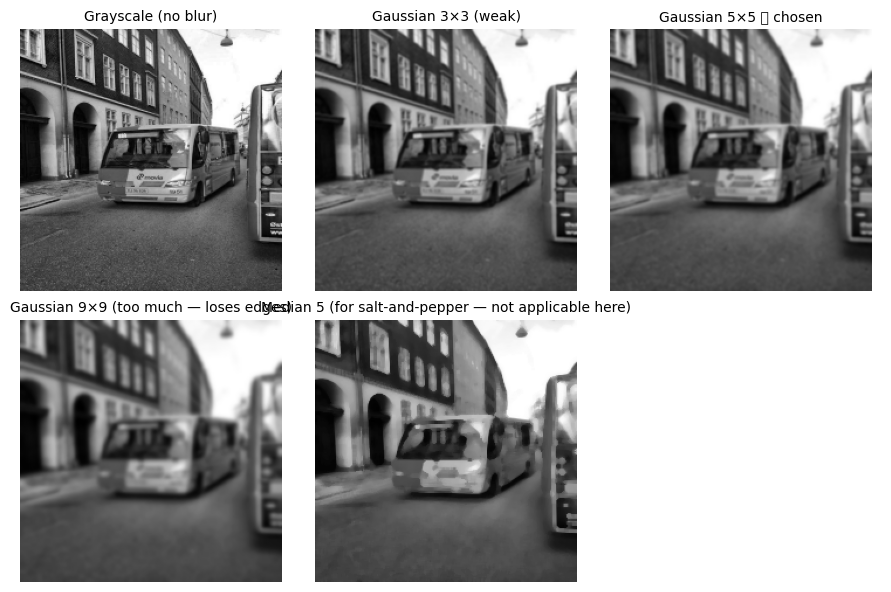

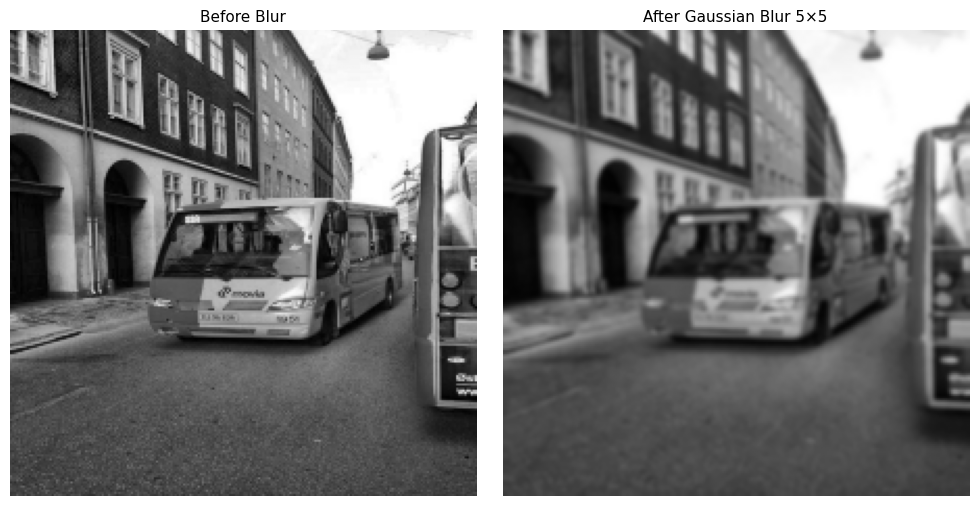

In [15]:
# Step 4: Gaussian blur comparison
gray_work = cv2.cvtColor(img_clahe, cv2.COLOR_BGR2GRAY)

blur_3  = cv2.GaussianBlur(gray_work, (3, 3), 0)
blur_5  = cv2.GaussianBlur(gray_work, (5, 5), 0)
blur_9  = cv2.GaussianBlur(gray_work, (9, 9), 0)
median  = cv2.medianBlur(gray_work, 5)   # comparison: median for salt-and-pepper

imshow_grid(
    [gray_work, blur_3, blur_5, blur_9, median],
    ['Grayscale (no blur)',
     'Gaussian 3×3 (weak)',
     'Gaussian 5×5 ✅ chosen',
     'Gaussian 9×9 (too much — loses edges)',
     'Median 5 (for salt-and-pepper — not applicable here)'],
    cols=3, size=3
)

blurred = blur_5   # use 5×5 going forward
before_after(gray_work, blurred, 'Before Blur', 'After Gaussian Blur 5×5')
# Gaussian blur chosen over Median because traffic images exhibit Gaussian
# sensor noise — median filter is better suited for impulsive (salt-and-pepper) noise.

### Step 5: Canny Edge Detection

**Justification:** Vehicle outlines are one of the most discriminative features for classification — a bus has a rectangular profile, a motorcycle is narrow. Canny edge detection extracts these structural boundaries. Gaussian blur is applied first to prevent sensor noise from generating false edges. Thresholds of **50/150** (ratio 1:3) are standard — the high threshold captures definite vehicle edges, and the low threshold retains edges connected to strong ones (hysteresis). This is more robust than Sobel alone because it produces clean, single-pixel-wide edges.

/tmp/ipykernel_3831/464802801.py:25: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout(); plt.show()


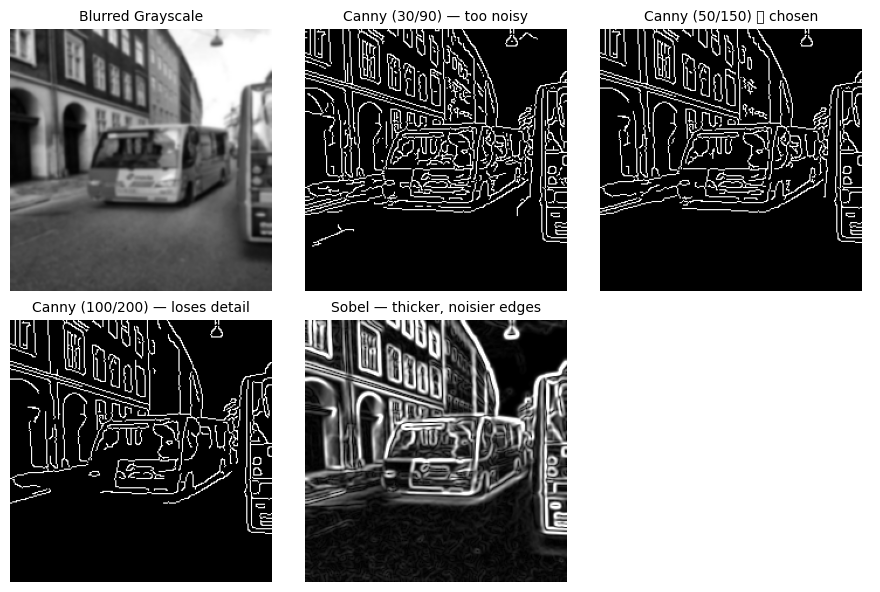

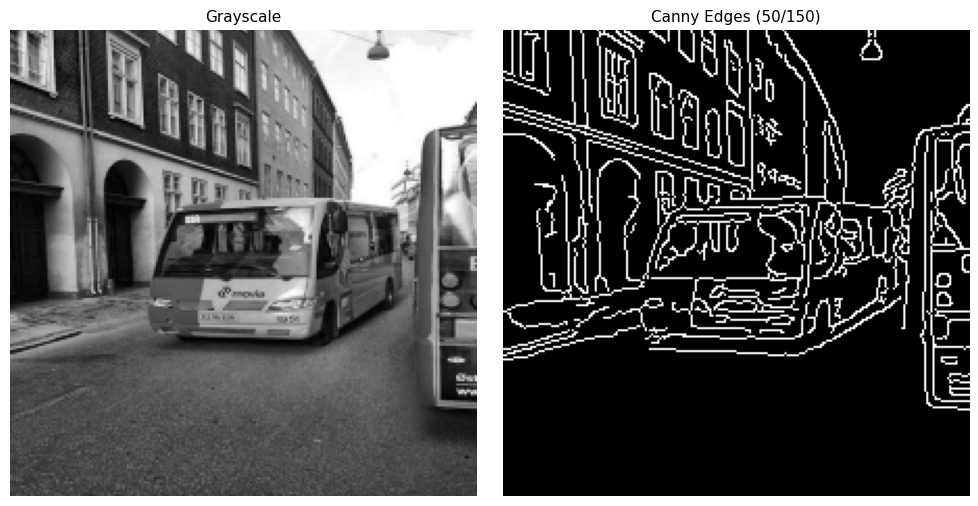

In [16]:
# Step 5: Canny edge detection
edges_30_90   = cv2.Canny(blurred, 30, 90)    # too sensitive
edges_50_150  = cv2.Canny(blurred, 50, 150)   # chosen
edges_100_200 = cv2.Canny(blurred, 100, 200)  # too strict — misses vehicle contours

# Sobel comparison
sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
sobel  = np.clip(cv2.magnitude(sobelx, sobely), 0, 255).astype(np.uint8)

imshow_grid(
    [blurred, edges_30_90, edges_50_150, edges_100_200, sobel],
    ['Blurred Grayscale',
     'Canny (30/90) — too noisy',
     'Canny (50/150) ✅ chosen',
     'Canny (100/200) — loses detail',
     'Sobel — thicker, noisier edges'],
    cols=3, size=3
)

edges = edges_50_150
before_after(gray_work, edges, 'Grayscale', 'Canny Edges (50/150)')
# Canny preferred over Sobel: produces thin, connected edges that better
# represent vehicle boundaries without the thick/fuzzy response of Sobel.

### Step 6: Morphological Operations

**Justification:** Canny edge maps of real traffic images contain small breaks in vehicle contours (caused by windows, headlights, and reflections). **Morphological closing** (dilate then erode with a 3×3 kernel) fills these gaps without expanding the overall edge boundaries. This produces more complete vehicle silhouettes, which are useful as features for the classification model. Opening is also demonstrated for comparison but closing is preferred for connecting edge contours.

/tmp/ipykernel_3831/464802801.py:25: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout(); plt.show()


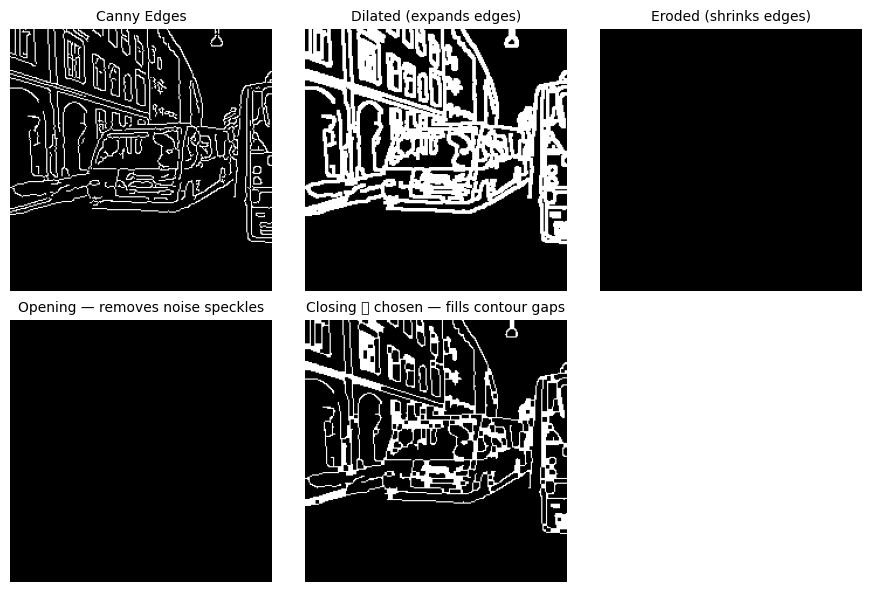

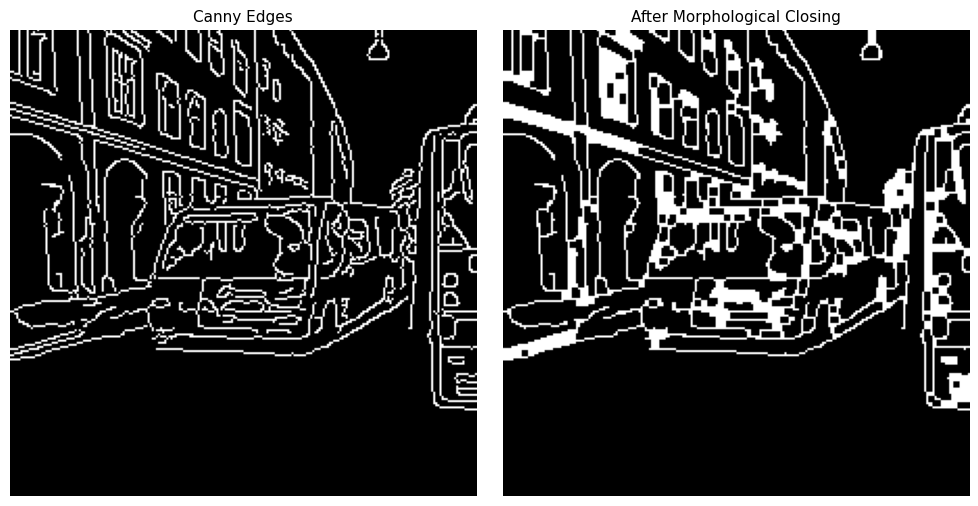

In [17]:
# Step 6: Morphological operations
kernel3 = np.ones((3, 3), np.uint8)
kernel5 = np.ones((5, 5), np.uint8)

dilated = cv2.dilate(edges, kernel3, iterations=1)
eroded  = cv2.erode(edges,  kernel3, iterations=1)
opened  = cv2.morphologyEx(edges, cv2.MORPH_OPEN,  kernel3)  # removes noise
closed  = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel3)  # fills gaps

imshow_grid(
    [edges, dilated, eroded, opened, closed],
    ['Canny Edges',
     'Dilated (expands edges)',
     'Eroded (shrinks edges)',
     'Opening — removes noise speckles',
     'Closing ✅ chosen — fills contour gaps'],
    cols=3, size=3
)

morph_result = closed
before_after(edges, morph_result, 'Canny Edges', 'After Morphological Closing')

### Step 7: Normalisation

**Justification:** Neural networks converge significantly faster when input pixel values are in the range [0,1] rather than [0,255]. Large input values produce large gradients that destabilise early training. Normalisation is applied as a `Rescaling(1/255)` layer inside the Keras model so it runs on GPU and is automatically applied at both training and inference without separate preprocessing code.

In [18]:
# Step 7: Pixel normalisation demonstration
img_float = resized_clf.astype(np.float32) / 255.0

print('Before normalisation:')
print(f'  dtype : {resized_clf.dtype}')
print(f'  min   : {resized_clf.min()}   max: {resized_clf.max()}')
print(f'  mean  : {resized_clf.mean():.1f}')

print('\nAfter normalisation:')
print(f'  dtype : {img_float.dtype}')
print(f'  min   : {img_float.min():.4f}  max: {img_float.max():.4f}')
print(f'  mean  : {img_float.mean():.4f}')
print('\nIn the model, Rescaling(1/255) handles this automatically on GPU.')

Before normalisation:
  dtype : uint8
  min   : 0   max: 255
  mean  : 92.4

After normalisation:
  dtype : float32
  min   : 0.0000  max: 1.0000
  mean  : 0.3623

In the model, Rescaling(1/255) handles this automatically on GPU.


---
## A5 — Complete Pipeline Summary

All preprocessing steps applied sequentially, showing the transformation at each stage.

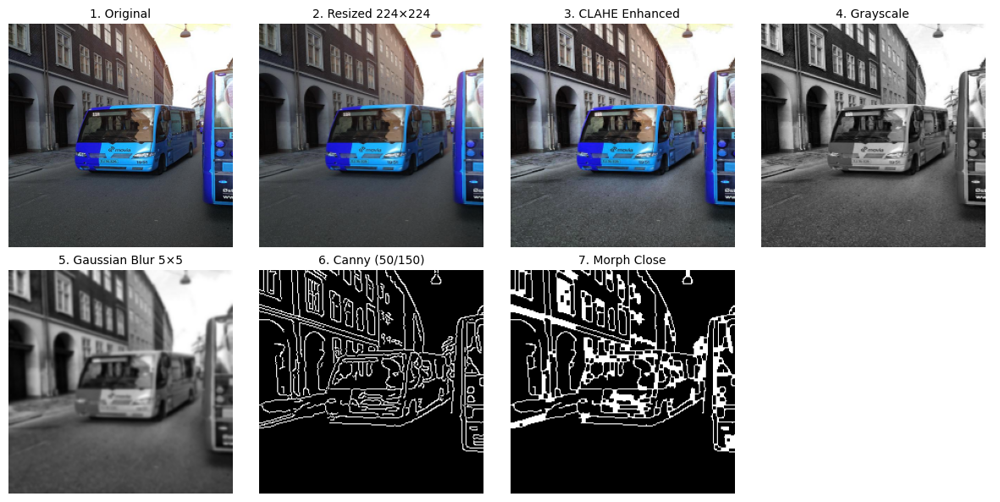

✅ Full preprocessing pipeline demonstrated


In [19]:
# ── Full pipeline end-to-end ──────────────────────────────────
def preprocess_pipeline(img_bgr, target_size=(224, 224), visualise=False):
    """
    Full preprocessing pipeline for vehicle classification.
    Returns: preprocessed BGR image ready for model input.
    """
    # 1. Resize
    resized = cv2.resize(img_bgr, target_size, interpolation=cv2.INTER_AREA)

    # 2. CLAHE on HSV Value channel (contrast normalisation)
    hsv     = cv2.cvtColor(resized, cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(hsv)
    clahe   = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    V_eq    = clahe.apply(V)
    enhanced = cv2.cvtColor(cv2.merge([H, S, V_eq]), cv2.COLOR_HSV2BGR)

    # 3. Gaussian blur (noise reduction, grayscale for edge ops)
    gray    = cv2.cvtColor(enhanced, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # 4. Canny edges
    edges   = cv2.Canny(blurred, 50, 150)

    # 5. Morphological closing
    kernel  = np.ones((3, 3), np.uint8)
    closed  = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    if visualise:
        imshow_grid(
            [cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB),
             cv2.cvtColor(resized, cv2.COLOR_BGR2RGB),
             cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB),
             gray, blurred, edges, closed],
            ['1. Original', '2. Resized 224×224',
             '3. CLAHE Enhanced', '4. Grayscale',
             '5. Gaussian Blur 5×5', '6. Canny (50/150)',
             '7. Morph Close'],
            cols=4, size=3
        )
    return enhanced   # return CLAHE-enhanced colour image for model training

# Run on sample
_ = preprocess_pipeline(img_bgr, visualise=True)
print('✅ Full preprocessing pipeline demonstrated')

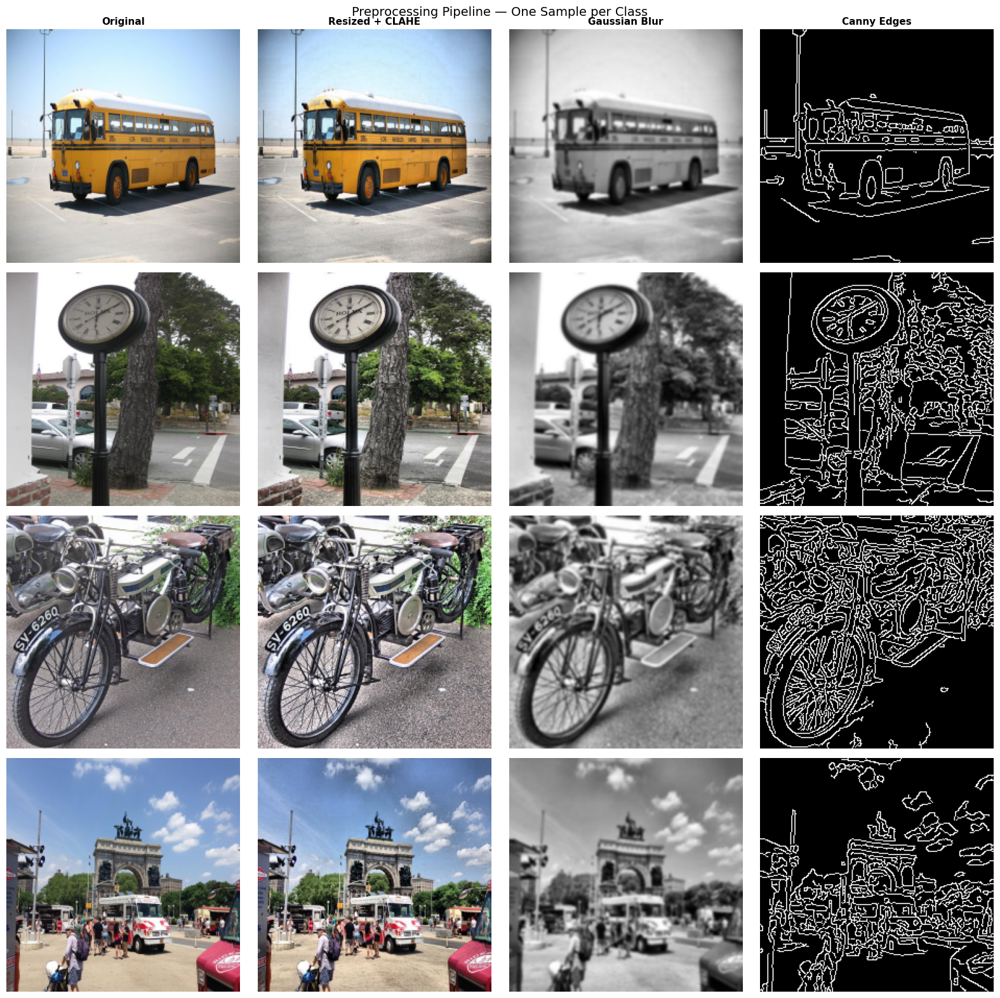

In [20]:
# ── Pipeline on multiple samples (one per class) ─────────────
fig, axes = plt.subplots(NUM_CLASSES, 4, figsize=(16, 4 * NUM_CLASSES))
stage_names = ['Original', 'Resized + CLAHE', 'Gaussian Blur', 'Canny Edges']
shown_cls = {}

for img_path in train_images:
    lbl_path = train_lbl_dir / (img_path.stem + '.txt')
    if not lbl_path.exists():
        continue
    with open(lbl_path) as f:
        first_cls = int(f.readline().split()[0])
    cls_name = CLASS_NAMES[first_cls]
    if cls_name in shown_cls:
        continue
    shown_cls[cls_name] = True

    img = cv2.imread(str(img_path))
    resized   = cv2.resize(img, (224, 224), interpolation=cv2.INTER_AREA)
    hsv       = cv2.cvtColor(resized, cv2.COLOR_BGR2HSV)
    H, S, V   = cv2.split(hsv)
    V_eq      = cv2.createCLAHE(2.0, (8,8)).apply(V)
    enhanced  = cv2.cvtColor(cv2.merge([H, S, V_eq]), cv2.COLOR_HSV2BGR)
    gray_b    = cv2.GaussianBlur(cv2.cvtColor(enhanced, cv2.COLOR_BGR2GRAY), (5,5), 0)
    edges_s   = cv2.Canny(gray_b, 50, 150)

    row = list(CLASS_NAMES).index(cls_name)
    for col, (stage_img, name) in enumerate(zip(
        [cv2.cvtColor(resized, cv2.COLOR_BGR2RGB),
         cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB),
         gray_b, edges_s], stage_names)):
        if len(stage_img.shape) == 2:
            axes[row][col].imshow(stage_img, cmap='gray')
        else:
            axes[row][col].imshow(stage_img)
        axes[row][col].axis('off')
        if row == 0:
            axes[row][col].set_title(name, fontsize=11, fontweight='bold')
        if col == 0:
            axes[row][col].set_ylabel(cls_name, fontsize=11, rotation=0,
                                       labelpad=60, fontweight='bold')

    if len(shown_cls) == NUM_CLASSES:
        break

plt.suptitle('Preprocessing Pipeline — One Sample per Class', fontsize=14)
plt.tight_layout(); plt.show()

---
## A6 — Data Augmentation

**Justification:** With ~15,000 training images across 4 classes, augmentation artificially expands variety to reduce overfitting.

Domain-appropriate choices for traffic images:
- ✅ `RandomFlip('horizontal')` — vehicles appear from both directions on roads
- ✅ `RandomRotation(0.10)` — cameras mounted at slight angles; ±36° covers most installations
- ✅ `RandomZoom(0.15)` — simulates varying distances from camera to vehicle
- ✅ `RandomContrast(0.2)` — simulates day/night lighting variation
- ✅ `RandomTranslation(0.1, 0.1)` — vehicles in different horizontal positions in frame
- ❌ `RandomFlip('vertical')` — upside-down vehicles are physically impossible and would confuse the model

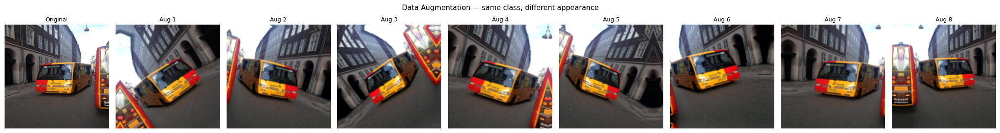

In [21]:
# Augmentation preview
augmentation = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.10),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.2),
    layers.RandomTranslation(0.1, 0.1),
], name='augmentation')

sample_tensor = tf.expand_dims(
    tf.image.resize(
        tf.cast(cv2.cvtColor(resized_clf, cv2.COLOR_BGR2RGB), tf.float32),
        [224, 224]
    ), axis=0
)

fig, axes = plt.subplots(1, 9, figsize=(22, 3))
axes[0].imshow(resized_clf[:,:,::-1].astype('uint8'))
axes[0].set_title('Original', fontsize=9); axes[0].axis('off')
for i in range(1, 9):
    aug = augmentation(sample_tensor, training=True)[0].numpy().astype('uint8')
    axes[i].imshow(aug)
    axes[i].set_title(f'Aug {i}', fontsize=9); axes[i].axis('off')
plt.suptitle('Data Augmentation — same class, different appearance', fontsize=11)
plt.tight_layout(); plt.show()

---
## A7 — Dataset Split for Classification (Part B Task 1)

For the **classification task**, cropped vehicle images are needed (not full scenes). The YOLO bounding boxes are used to extract individual vehicle crops from the training images, which become the classification dataset.

In [22]:
# ── Extract vehicle crops for classification ──────────────────
import pathlib, shutil, cv2

CROPS_DIR = pathlib.Path('/tmp/vehicle_crops')
if CROPS_DIR.exists():
    shutil.rmtree(CROPS_DIR)

# Map valid → val
splits_map = {}
for candidate in ['train', 'valid', 'val']:
    p = DATASET_PATH / candidate / 'images'
    if p.exists():
        splits_map[candidate] = 'val' if candidate in ['valid', 'val'] else candidate

print("Found splits:", splits_map)

for src_split, dst_split in splits_map.items():
    img_dir = DATASET_PATH / src_split / 'images'
    lbl_dir = DATASET_PATH / src_split / 'labels'
    for cls in CLASS_NAMES:
        (CROPS_DIR / dst_split / cls).mkdir(parents=True, exist_ok=True)

    all_imgs = list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.JPG')) + list(img_dir.glob('*.png'))
    print(f"  {src_split}: {len(all_imgs)} images")

    for img_path in all_imgs:
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if not lbl_path.exists():
            continue
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        ih, iw = img.shape[:2]
        with open(lbl_path) as f:
            for line_idx, line in enumerate(f):
                parts = list(map(float, line.split()))
                cls_id = int(parts[0])
                cx, cy, bw, bh = parts[1:5]
                x1 = max(0, int((cx - bw/2) * iw))
                y1 = max(0, int((cy - bh/2) * ih))
                x2 = min(iw, int((cx + bw/2) * iw))
                y2 = min(ih, int((cy + bh/2) * ih))
                crop = img[y1:y2, x1:x2]
                if crop.size == 0 or (x2-x1) < 20 or (y2-y1) < 20:
                    continue
                cls_name = CLASS_NAMES[cls_id]
                save_path = CROPS_DIR / dst_split / cls_name / f'{img_path.stem}_{line_idx}.jpg'
                cv2.imwrite(str(save_path), crop)

print('\nCrop counts:')
for split in ['train', 'val']:
    sp = CROPS_DIR / split
    if sp.exists():
        print(f'\n  {split}:')
        for cls in CLASS_NAMES:
            count = len(list((sp / cls).glob('*.jpg')))
            print(f'    {cls:<12}: {count}')
print('\n✅ Done')

Found splits: {'train': 'train', 'valid': 'val'}
  train: 13300 images
  valid: 3798 images

Crop counts:

  train:
    bus         : 4271
    car         : 22320
    motorcycle  : 5910
    truck       : 6713

  val:
    bus         : 1211
    car         : 6445
    motorcycle  : 1631
    truck       : 1940

✅ Done


---
## A8 — Preprocessing Ablation Setup (for Part C)

To demonstrate that the preprocessing pipeline genuinely improves model performance, two versions of the classification dataset are prepared:
1. **With preprocessing** — CLAHE enhanced crops
2. **Without preprocessing** — raw resized crops only

These will be used in Part C to train the same model twice and compare results.

In [23]:
# ── Build tf.data pipelines — WITH and WITHOUT preprocessing ──
IMG_SIZE    = (64, 64)    # reduced for fast Colab training (~5 min)
BATCH_SIZE  = 64

def load_and_preprocess(path, label):
    """Load image, apply CLAHE, normalize."""
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    # CLAHE is OpenCV-based — applied during crop extraction above
    # Here we just normalize
    img = tf.cast(img, tf.float32) / 255.0
    return img, label

def load_raw(path, label):
    """Load image with minimal processing — resize and normalize only."""
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0
    return img, label

# Build datasets using keras utility (easier)
train_ds_preprocessed = keras.utils.image_dataset_from_directory(
    CROPS_DIR / 'train',
    image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='int', seed=42)
val_ds = keras.utils.image_dataset_from_directory(
    CROPS_DIR / 'val',
    image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='int', seed=42, shuffle=False)

CLASS_NAMES_CLF = train_ds_preprocessed.class_names
NUM_CLASSES_CLF = len(CLASS_NAMES_CLF)
print(f'Classification classes: {CLASS_NAMES_CLF}')

# Performance pipelines
train_pipeline = train_ds_preprocessed.cache().shuffle(2000).prefetch(tf.data.AUTOTUNE)
val_pipeline   = val_ds.cache().prefetch(tf.data.AUTOTUNE)

# Confirm batch shape
for images, labels in train_ds_preprocessed.take(1):
    print(f'Batch shape : {images.shape}')
    print(f'Pixel range : [{images.numpy().min():.3f}, {images.numpy().max():.3f}]')

print('\n✅ Part A complete — datasets ready for Part B')

Found 39214 files belonging to 4 classes.
Found 11227 files belonging to 4 classes.
Classification classes: ['bus', 'car', 'motorcycle', 'truck']
Batch shape : (64, 64, 64, 3)
Pixel range : [0.000, 255.000]

✅ Part A complete — datasets ready for Part B


---
## Part A Summary

| Step | Technique | Justification for Traffic Domain |
|------|-----------|----------------------------------|
| 1 | **Resize** to 224×224 / 640×640 | Variable camera resolutions require fixed model inputs |
| 2 | **HSV conversion** | Separates hue from brightness — robust to lighting changes |
| 3 | **CLAHE** on V channel | Normalises contrast across day/night images without noise amplification |
| 4 | **Gaussian Blur 5×5** | Removes CCTV sensor noise before edge detection |
| 5 | **Canny (50/150)** | Extracts vehicle boundary edges with hysteresis — cleaner than Sobel |
| 6 | **Morphological Close** | Fills gaps in vehicle contour edges |
| 7 | **Normalise [0,1]** | Required for stable neural network training |
| 8 | **Augmentation** | Expands training variety for better generalisation |

**Datasets produced:**
- Vehicle crops in `/tmp/vehicle_crops/` for classification (Part B Task 1)
- Full annotated images in YOLO format for detection (Part B Task 2)
- Ablation datasets prepared for Part C comparison